# Global Power Plant Dataset

This is done as part of the General Assembly training program requirement. 

For this project, I will be working on the global power plant dataset. World Resources Institute (WRI) experts and their partners created the Global Power Plant Database from official government data and independent sources around the world and delivered the final database as an open data resource. The database collects the following characteristics and indicators:
- All types of fuel 
- Technical characteristics (fuel, technology, ownership)
- Operational characteristics (generation)
- Plants’ geolocation
- Plants over 1 megawatt (MW) 
- Plants in operation only (in first iteration)

**Step 1:Import the required modules and packages to run the codes**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import geopandas as gpd


# set the plots to display in the Jupyter notebook itself
%matplotlib inline

# change plotting colors per client request
plt.style.use('ggplot')

# Increase default figure and font sizes for easier viewing.
plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['font.size'] = 14

**Step 2: Read the dataset using pandas**

In [2]:
gpp = pd.read_csv("global_power_plant_database.csv")

#to know the number of rows and columns in the dataset
gpp.shape

C:\Users\linges14\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(34936, 36)

**This particular dataset has ==> 34936 rows  ==> 36 columns**

In [3]:
# to know the range and data type and null objects of each column we use the following code
# gpp.info()

Adding a continent column to the gpp dataset, using another dataset, "naturalearth_lowres" a GeoDataFrame.Call the dataset using geopandas module. Then pull the required column ( country and iso_a3) and merge it into the initial gpp dataset to form the continent column.

In [4]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world = world[['iso_a3','continent']] #pulling the needed column from the second dataset
gpp = gpp.merge(world,how = 'left',left_on = 'country',right_on = 'iso_a3') ##merging it to initial dataset

In [5]:
# gpp.info()

After merging there are still some rows without continent, find out what these countries are and fill in the corresponding values.
<br />

In [6]:
gpp.loc[pd.isna(gpp.continent),:].country_long.unique()

array(['Bahrain', 'Cape Verde', 'France', 'French Guiana', 'Kosovo',
       'Mauritius', 'Norway', 'Saint Lucia', 'Singapore'], dtype=object)

In [7]:
continent_map = {'Bahrain':'Asia','Cape Verde':'Africa','France':'Europe','French Guiana':'South America','Kosovo':'Europe','Mauritius':'Africa','Norway':'Europe','Singapore':'Asia'}
for key,val in continent_map.items():
    gpp.loc[gpp.country_long==key,'continent'] = val

# gpp.info ()


Adding a column that shows if a fuel source is renewable or non - renewable

In [8]:
fuel_map = {'Coal':'Fossil','Gas':'Fossil','Gas':'Fossil','Oil':'Fossil','Petcoke':'Fossil','Geothermal':'Other_renewable','Biomass':'Other_renewable','Storage':'Other',
            'Cogeneration':'Other','Waste':'Other','Hydro':'Hydro','Nuclear':'Nuclear','Wind':'Wind','Solar':'Solar','Other':'Other'}
gpp['fuel_type'] = gpp.primary_fuel.map(fuel_map)
renewable = ['Hydro','Other_renewable','Wind','Solar']
gpp['renewable'] = ['renewable' if i in renewable else 'non-renewable' for i in gpp['fuel_type'] ]
gpp.head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017,iso_a3,continent,fuel_type,renewable
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.322,65.1190,Hydro,NaN,NaN,...,119.50,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,AFG,Asia,Hydro,renewable
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.670,65.7950,Solar,NaN,NaN,...,18.29,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,AFG,Asia,Solar,renewable
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.623,65.7920,Solar,NaN,NaN,...,18.72,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,AFG,Asia,Solar,renewable
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.556,69.4787,Hydro,NaN,NaN,...,174.91,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,AFG,Asia,Hydro,renewable
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.641,69.7170,Hydro,NaN,NaN,...,350.80,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,AFG,Asia,Hydro,renewable


**Step 3: Cleaning the datasets**

Dropping the columns we won't be using
<br />
Dropped those columns because more than half of the data were null values, hence it won't contributing much for data analysis

In [9]:
to_drop = ['other_fuel1', 'other_fuel2', 'other_fuel3', 'commissioning_year','owner', 'source', 'url', 
           'geolocation_source', 'wepp_id','generation_gwh_2013', 'generation_gwh_2014','generation_gwh_2015',
           'generation_gwh_2016','generation_gwh_2018', 'estimated_generation_gwh_2013',
          'estimated_generation_gwh_2014', 'estimated_generation_gwh_2015','estimated_generation_gwh_2016',
          'estimated_generation_note_2013', 'estimated_generation_note_2014', 'estimated_generation_note_2015',
          'estimated_generation_note_2016', 'estimated_generation_note_2017', 'generation_data_source', 'iso_a3']

gpp.drop(to_drop, inplace=True, axis=1) ## in axis we set it to 1, cuz we wanna drop columns
gpp.head()

#  since inplace true is used, running it again will throw an error as the columns are already dropped


,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,year_of_capacity_data,generation_gwh_2017,generation_gwh_2019,estimated_generation_gwh_2017,continent,fuel_type,renewable
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.322,65.1190,Hydro,2017.0,NaN,NaN,119.50,Asia,Hydro,renewable
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.670,65.7950,Solar,NaN,NaN,NaN,18.29,Asia,Solar,renewable
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.623,65.7920,Solar,NaN,NaN,NaN,18.72,Asia,Solar,renewable
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.556,69.4787,Hydro,2017.0,NaN,NaN,174.91,Asia,Hydro,renewable
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.641,69.7170,Hydro,2017.0,NaN,NaN,350.80,Asia,Hydro,renewable


The initial index starts from zero, so drop the zero and start from 1

In [10]:
gpp.drop(index = [0],inplace = True)

Renaming the columns for a better representation

In [11]:
gpp.rename(columns = {'country':'country_code','country_long':'country', 'name':'PowerPlant'},inplace = True)
gpp.head()

,country_code,country,PowerPlant,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,year_of_capacity_data,generation_gwh_2017,generation_gwh_2019,estimated_generation_gwh_2017,continent,fuel_type,renewable
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.00,31.6700,65.7950,Solar,NaN,NaN,NaN,18.29,Asia,Solar,renewable
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.00,31.6230,65.7920,Solar,NaN,NaN,NaN,18.72,Asia,Solar,renewable
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.00,34.5560,69.4787,Hydro,2017.0,NaN,NaN,174.91,Asia,Hydro,renewable
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.00,34.6410,69.7170,Hydro,2017.0,NaN,NaN,350.80,Asia,Hydro,renewable
5,AFG,Afghanistan,Nangarhar (Darunta) Hydroelectric Power Plant ...,GEODB0040536,11.55,34.4847,70.3633,Hydro,2017.0,NaN,NaN,46.12,Asia,Hydro,renewable


**Dropping the null values and filling it with either mean or median values for analysis**

In [12]:
gpp['year_of_capacity_data'].fillna(value='2017',inplace= True)
gpp.head(10) 
###'''I filled in the NaN values with 2017, because, according to the research conducted on the datasets most of the 
### plants were built in 2017. Year of capacity means the year it started operating to the fullest'''
# gpp.head(100)

,country_code,country,PowerPlant,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,year_of_capacity_data,generation_gwh_2017,generation_gwh_2019,estimated_generation_gwh_2017,continent,fuel_type,renewable
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.00,31.6700,65.7950,Solar,2017,NaN,NaN,18.29,Asia,Solar,renewable
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.00,31.6230,65.7920,Solar,2017,NaN,NaN,18.72,Asia,Solar,renewable
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.00,34.5560,69.4787,Hydro,2017,NaN,NaN,174.91,Asia,Hydro,renewable
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.00,34.6410,69.7170,Hydro,2017,NaN,NaN,350.80,Asia,Hydro,renewable
5,AFG,Afghanistan,Nangarhar (Darunta) Hydroelectric Power Plant ...,GEODB0040536,11.55,34.4847,70.3633,Hydro,2017,NaN,NaN,46.12,Asia,Hydro,renewable
6,AFG,Afghanistan,Northwest Kabul Power Plant Afghanistan,GEODB0040540,42.00,34.5638,69.1134,Gas,2017,NaN,NaN,NaN,Asia,Fossil,non-renewable
7,AFG,Afghanistan,Pul-e-Khumri Hydroelectric Power Plant Afghani...,GEODB0040537,6.00,35.9416,68.7100,Hydro,2017,NaN,NaN,19.74,Asia,Hydro,renewable
8,AFG,Afghanistan,Sarobi Dam Hydroelectric Power Plant Afghanistan,GEODB0040535,22.00,34.5865,69.7757,Hydro,2017,NaN,NaN,80.00,Asia,Hydro,renewable
9,ALB,Albania,Bistrica 1,WRI1002169,27.00,39.9116,20.1047,Hydro,2017,NaN,NaN,88.45,Europe,Hydro,renewable
10,ALB,Albania,Fierza,WRI1002170,500.00,42.2514,20.0431,Hydro,2017,NaN,NaN,1648.24,Europe,Hydro,renewable


In [13]:
gpp.fillna(value={'generation_gwh_2019': gpp['generation_gwh_2019'].median()}, inplace= True)
gpp.fillna(value={'generation_gwh_2017': gpp['generation_gwh_2017'].median()}, inplace= True)
gpp.head(10)
## I filled in the null values in the generation_gwh_2019 column with median of that particular column
## I chose median, cuz the median values seems more reasonable than the mean values

,country_code,country,PowerPlant,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,year_of_capacity_data,generation_gwh_2017,generation_gwh_2019,estimated_generation_gwh_2017,continent,fuel_type,renewable
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.00,31.6700,65.7950,Solar,2017,17.8765,11.53,18.29,Asia,Solar,renewable
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.00,31.6230,65.7920,Solar,2017,17.8765,11.53,18.72,Asia,Solar,renewable
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.00,34.5560,69.4787,Hydro,2017,17.8765,11.53,174.91,Asia,Hydro,renewable
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.00,34.6410,69.7170,Hydro,2017,17.8765,11.53,350.80,Asia,Hydro,renewable
5,AFG,Afghanistan,Nangarhar (Darunta) Hydroelectric Power Plant ...,GEODB0040536,11.55,34.4847,70.3633,Hydro,2017,17.8765,11.53,46.12,Asia,Hydro,renewable
6,AFG,Afghanistan,Northwest Kabul Power Plant Afghanistan,GEODB0040540,42.00,34.5638,69.1134,Gas,2017,17.8765,11.53,NaN,Asia,Fossil,non-renewable
7,AFG,Afghanistan,Pul-e-Khumri Hydroelectric Power Plant Afghani...,GEODB0040537,6.00,35.9416,68.7100,Hydro,2017,17.8765,11.53,19.74,Asia,Hydro,renewable
8,AFG,Afghanistan,Sarobi Dam Hydroelectric Power Plant Afghanistan,GEODB0040535,22.00,34.5865,69.7757,Hydro,2017,17.8765,11.53,80.00,Asia,Hydro,renewable
9,ALB,Albania,Bistrica 1,WRI1002169,27.00,39.9116,20.1047,Hydro,2017,17.8765,11.53,88.45,Europe,Hydro,renewable
10,ALB,Albania,Fierza,WRI1002170,500.00,42.2514,20.0431,Hydro,2017,17.8765,11.53,1648.24,Europe,Hydro,renewable


In [14]:
gpp.fillna(value={'estimated_generation_gwh_2017': gpp['estimated_generation_gwh_2017'].mean()}, inplace = True)
gpp.head(10)

,country_code,country,PowerPlant,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,year_of_capacity_data,generation_gwh_2017,generation_gwh_2019,estimated_generation_gwh_2017,continent,fuel_type,renewable
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.00,31.6700,65.7950,Solar,2017,17.8765,11.53,18.290000,Asia,Solar,renewable
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.00,31.6230,65.7920,Solar,2017,17.8765,11.53,18.720000,Asia,Solar,renewable
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.00,34.5560,69.4787,Hydro,2017,17.8765,11.53,174.910000,Asia,Hydro,renewable
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.00,34.6410,69.7170,Hydro,2017,17.8765,11.53,350.800000,Asia,Hydro,renewable
5,AFG,Afghanistan,Nangarhar (Darunta) Hydroelectric Power Plant ...,GEODB0040536,11.55,34.4847,70.3633,Hydro,2017,17.8765,11.53,46.120000,Asia,Hydro,renewable
6,AFG,Afghanistan,Northwest Kabul Power Plant Afghanistan,GEODB0040540,42.00,34.5638,69.1134,Gas,2017,17.8765,11.53,716.461393,Asia,Fossil,non-renewable
7,AFG,Afghanistan,Pul-e-Khumri Hydroelectric Power Plant Afghani...,GEODB0040537,6.00,35.9416,68.7100,Hydro,2017,17.8765,11.53,19.740000,Asia,Hydro,renewable
8,AFG,Afghanistan,Sarobi Dam Hydroelectric Power Plant Afghanistan,GEODB0040535,22.00,34.5865,69.7757,Hydro,2017,17.8765,11.53,80.000000,Asia,Hydro,renewable
9,ALB,Albania,Bistrica 1,WRI1002169,27.00,39.9116,20.1047,Hydro,2017,17.8765,11.53,88.450000,Europe,Hydro,renewable
10,ALB,Albania,Fierza,WRI1002170,500.00,42.2514,20.0431,Hydro,2017,17.8765,11.53,1648.240000,Europe,Hydro,renewable


In [15]:
gpp.describe()

,capacity_mw,latitude,longitude,generation_gwh_2017,generation_gwh_2019,estimated_generation_gwh_2017
count,34935.000000,34935.000000,34935.000000,34935.000000,34935.000000,34935.000000
mean,163.358879,32.816651,-6.974867,192.990219,125.550282,716.461393
std,489.642583,22.638926,78.406024,1268.268145,911.920887,2419.617939
min,1.000000,-77.847000,-179.977700,-934.944000,-780.339000,0.000000
25%,4.900000,29.256250,-77.641700,17.876500,11.530000,8.960000
50%,16.700000,39.728300,-2.127200,17.876500,11.530000,45.350000
75%,75.388500,46.263550,49.489700,17.876500,11.530000,354.375000
max,22500.000000,71.292000,179.388700,36448.643000,31920.368000,82810.770000


In [16]:
gpp.isnull().sum()

country_code                      0
country                           0
PowerPlant                        0
gppd_idnr                         0
capacity_mw                       0
latitude                          0
longitude                         0
primary_fuel                      0
year_of_capacity_data             0
generation_gwh_2017               0
generation_gwh_2019               0
estimated_generation_gwh_2017     0
continent                         1
fuel_type                        10
renewable                         0
dtype: int64

**Step 4: Analysis of the datasets**

**Graph of country vs number of power plants**

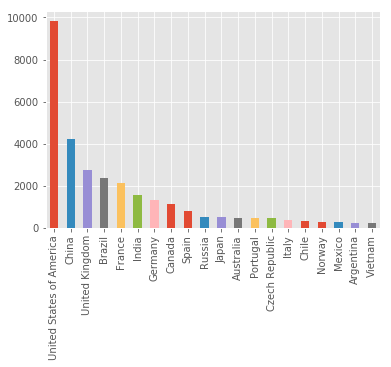

In [17]:
## The graph shows the first 20 country with highest count of power plants
## since I have 167 countries in my dataset, plotting all 167 countries would not be advisable

country_bar = gpp['country'].value_counts().head(20).plot(kind='bar')

**The graph below compares the energy generation between renewable fuel source and non renewable fuel source for the first 15 countries. And from there we can determine how green a country is. If the energy generation of non renewable source outweighs renewable source, then the country is less green and vice versa.**

Text(0, 0.5, 'Energy generation (gw)')

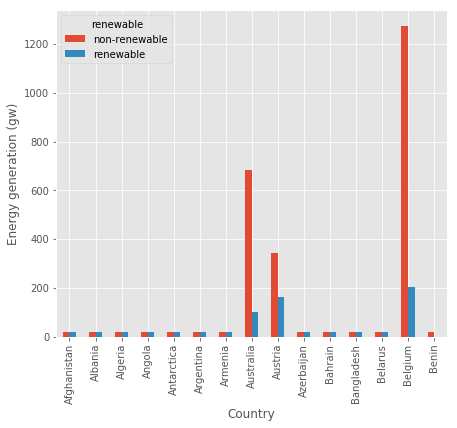

In [18]:
# Pivot the gpp so that there's a column for either renewable source or non_renewable source,
# each row represents a country, and the cells have the energy generation in gigawatt per hour for year 2017\

gpp_pivot = pd.pivot_table(gpp,values="generation_gwh_2017",index="country",columns="renewable",aggfunc=np.mean).head(15)

# Plot a bar chart using the gpp
ax = gpp_pivot.plot(kind="bar")
# Get a Matplotlib figure from the axes object for formatting purposes
fig = ax.get_figure()
# Change the plot dimensions (width, height)
fig.set_size_inches(7, 6)
# Change the axes labels
ax.set_xlabel("Country")
ax.set_ylabel("Energy generation (gw)")



**From the graph above one can learn that for countries (Afghanistan, Albania, Algeria, Angola, Antartica, Argentina, Armenia, Azerbaijan, Bahrain, Bangladesh and Belarus) has almost equal value of energy generation for both renewable and non renewable source. Hence It can be concluded that the country is pretty green. Whereas for Australia, Austria and Belgium, the energy generation from non renewable source has outweighed the energy generation of the renewable source. Hence, one can conclude that those countries are less green. For Benin, the energy generation is solely from non renewable source.**

In [19]:
class Energy():
    
    def __init__(self):
        print("Hi. You're now accessing the Global Power Plant database")

    def major_source(self):
        ## prints a sunburst chart that compares all the countries and their fuel source
        gpp_chart = gpp.groupby(by=["continent","country", "primary_fuel"]).count()[["country_code"]].rename(columns={"country_code":"Num of PP"})
        gpp_chart["World"] = "World"
        gpp_chart = gpp_chart.reset_index()
        #gpp_chart.head()
        
        fig = px.sunburst(gpp_chart,
                  path=[ "World",'continent',"country", "primary_fuel"],
                  values='Num of PP',
                  title="World major power source",
                  width=750, height=750)
                
        fig.show()
        
        
    def world_loc(self):
        fig = px.scatter_mapbox(gpp, lat="latitude", lon="longitude", hover_name="country", hover_data=["primary_fuel", "estimated_generation_gwh_2017"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
        fig.update_layout(mapbox_style="white-bg",
                          mapbox_layers=[
                              {"below": 'traces',
                               "sourcetype": "raster",
                               "sourceattribution": "United States Geological Survey",
                               "source": ["https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"]
                               }
                          ])
        fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
        fig.show()

        
    def list_of_pp(self):
        country_input = input ("Which country are you from?")
        if country_input in gpp.country.unique():       
            return gpp.loc[gpp['country']==country_input ,['PowerPlant']]
        else:
            print ("Not in the list")
        
        
        
    def pp_loc(self, name):
        ## When user inputs the name as an argument, the function gives out the location of the plant
        self.name = name
        if name in gpp.PowerPlant.unique():
            for i in range(len(gpp.PowerPlant.unique())):
                lat = gpp.iloc[i]['latitude']
                long = gpp.iloc[i]['longitude']
                return ("Location of power plant {} is {}, {}".format(name,lat, long))
    
            


print("It runs")

It runs


In [20]:
q= Energy()

Hi. You're now accessing the Global Power Plant database


In [21]:
q.major_source()

In [22]:
q.list_of_pp()

Which country are you from?Iran


,PowerPlant
15819,Abadan C.C.
15820,Ahwaz (ramiin)
15821,Aliabad Power Plant
15822,Amir Kabir
15823,Amir Kabir
15824,Ardebil Sabalan
15825,Ardestan
15826,Asalooyeh
15827,Asaluyeh Power Plant
15828,Bandar Abbas


In [23]:
q.pp_loc("Yazd")

'Location of power plant Yazd is 31.67, 65.795'

In [24]:
q.world_loc()